In [1]:
import sys
sys.path.insert(0, '../../stock_factor_lab/')

In [41]:
START_DATE = '2003-3-31'
END_DATE = '2024-3-31'

# 台股布林通道

### 回測期間 - 2003/3/31  ~ 2009/3/31 

## import

In [3]:
import talib
from get_data import Data
import backtest
from combinations import sim_conditions
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import plotly.graph_objects as go
# import plotly.graph_objs as go
import plotly.express as px
from itertools import cycle
from plotly.subplots import make_subplots
from matplotlib import rcParams
rcParams['font.sans-serif'] = ['Microsoft JhengHei']
import matplotlib as mpl
mpl.rcParams['axes.unicode_minus'] = False
from matplotlib.ticker import FuncFormatter
import matplotlib.dates as mdates
from datetime import datetime
from dateutil.relativedelta import relativedelta



from dataframe import CustomDataFrame

import plot_data

## get data

In [4]:
data=Data()

---

## 資料下載

### **盈餘再投資率**

In [42]:
profit = data.get('annual_report_fundamentals:常續性稅後淨利')

In [43]:
# 抓資料
long_term_items = [
    '透過損益按公允價值衡量之金融資產－非流動',
    '透過其他綜合損益按公允價值衡量之金融資產－非流動',
    '按攤銷後成本衡量之金融資產－非流動',
    '避險之金融資產－非流動',
    '合約資產－非流動',
    '採權益法之長期股權投資',
    '預付投資款',
    '投資性不動產淨額'
]

# 長期投資項目 (8個)
long_term_data = [data.get(f'annual_report_fundamentals:{item}').fillna(0) for item in long_term_items]
long_term_investment = sum(long_term_data)
# 固定資產
fixed_assets_year = data.get('annual_report_fundamentals:不動產廠房及設備').fillna(0)

In [44]:
# 計算盈再率分子
long_term_investment_df = (long_term_investment - long_term_investment.shift(4))#['2000':].astype('int64')
fixed_assets_df = (fixed_assets_year - fixed_assets_year.shift(4))#['2000':].astype('int64')

In [45]:
profit_rol_df = profit.rolling(4).sum()#['2000':]

In [46]:
# 計算出盈再率
# 去掉淨利為負的公司 (當年度淨利為負、四年加總淨利為負都去掉)
rr = (long_term_investment_df + fixed_assets_df) / profit_rol_df
rr = rr[(profit > 0) & (profit_rol_df > 0)]

### 盈再率 - 數值分佈

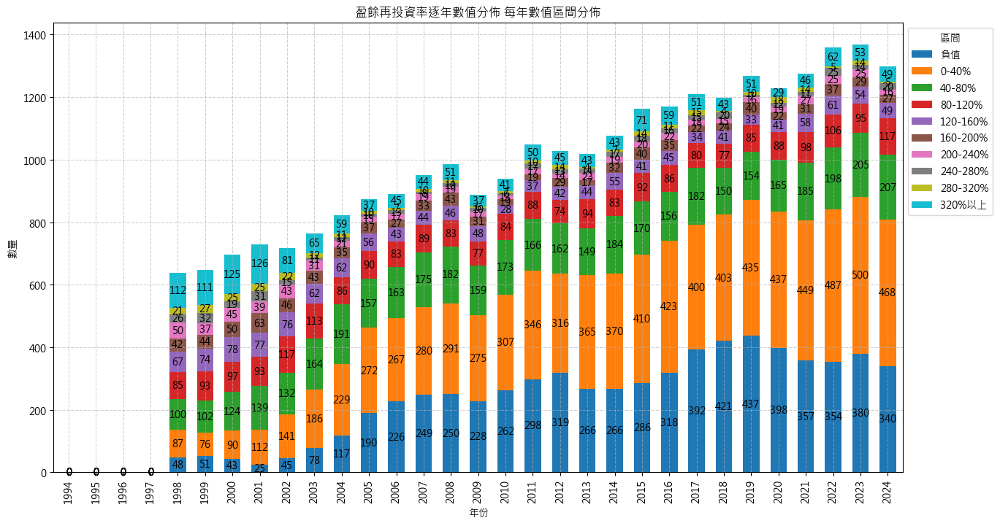

In [47]:
plot_data.numeric_bins(rr, "盈餘再投資率逐年數值分佈", stacked=True, num_label=True,
                bins=[-np.inf, 0, 0.40, 0.80, 1.20, 1.60, 2.00, 2.40, 2.80, 3.20, np.inf], 
                labels=['負值' ,'0-40%', '40-80%', '80-120%', '120-160%', '160-200%', '200-240%', '240-280%', '280-320%', '320%以上'])

---

### **本益比 (P/E)**
- 每季資料
- 每日資料

In [48]:
pe = data.get('quarter_report:PE') #[START_DATE:END_DATE]
daily_pe = data.get('price:daily_pe') #[START_DATE:END_DATE]

### **其他因子**

- ROE (季資料，取第四季)
- 股利支付率 (只有年資料) ＝〈現金股利總額〈元〉／ 股利分配年度之稅後淨利〉x 100
- 董監持股 (沒有每年的資料，缺值採向前補值)
- 上市上櫃滿兩年

In [49]:
roe = data.get('annual_report:ROE')
payout_ratio = data.get('annual_report_fundamentals:股利支付率')

In [50]:
stock_hold = data.get('annual_report_fundamentals:董監持股%')

In [51]:
# listed_date = pd.read_csv('../2024_code/最近上市日.csv', encoding='cp950')

##### 上市上櫃滿兩年

In [52]:
close = data.get('price:close')
comp_profile = data.get('company_profile')



stock_data = {}

for index, row in comp_profile.iterrows():
    stock_code = row['company_symbol']
    listed_date_ = row['ipo_date']
    end_date = listed_date_ + pd.DateOffset(years=2)
    
    # 創建一個全為 True 的 series
    series = pd.Series(True, index=close.index)
    # 在上市日之前和之後兩年內設置為 False
    series.loc[:end_date] = False
    
    stock_data[stock_code] = series

listed = pd.concat(stock_data, axis=1)

---

## 選股條件
- ROE 五年平均 > 15%
- 盈再率 < 80%
- 稅後淨利 > 五億
- 配息 > 40%
- 董監持股 > 10%
- 上市上櫃滿兩年
- PE < 12買入，>30賣出

In [53]:
# ROE 5年平均 > 15%
roe_rol = roe.rolling(5).mean()
roe_15 = (roe_rol > 15)

In [54]:
rr_cond = (rr < 0.4)

In [55]:
# *最近3年的配息率有無一年不及40%*
payout_ratio_cond = (payout_ratio.rolling(3).min() >= 40)

# # 金融股看配息率，不看盈再率
# rr_cond[finance_stock_list] = payout_ratio_cond[finance_stock_list]

In [56]:
# 淨利 > 5億
profit_cond = (profit > 500000) # TEJ 的淨利單位是千元

In [57]:
hold_cond = stock_hold > 10

In [58]:
listed = listed.resample('M').last()

---

## test

In [27]:
def trades_cagr_analysis_split_returns(
    factor_cond, factor, title, N=5, split_date='2008-03', start_date='2003-03', end_date='2009-03', 
    data=data, remove=False, interval_range=(15, 50, 5),
    percentage=True
):
    
    split_date = pd.Timestamp(split_date)

    
    rep = backtest.sim(factor_cond[start_date:end_date], resample='M', data=data)
    trades = rep.trades

    # 個股每月報酬率
    monthly_returns = ((rep.cashflow.resample('M').last() / rep.cashflow.resample('M').first()) - 1).resample('A-MAR').sum()

    # 分段結果存放
    x_values_first, y_values_first, stock_ids_first = [], [], []
    x_values_second, y_values_second, stock_ids_second = [], [], []

    # 逐筆查看交易明細中的個股
    for trade_id, row in trades.iterrows():
        entry_date = row['entry_sig_date']
        exit_date = row['exit_sig_date']
        stock_id = trades['stock_id'][trade_id]

        # 如果出場日為 NaN，設定 exit_date 為分析的 end_date
        if pd.isna(exit_date):
            exit_date = pd.Timestamp(end_date)

        factor_series = factor[stock_id][:pd.Timestamp(entry_date) + pd.DateOffset(days=1)].dropna()
        if not factor_series.empty:
            factor_value = factor_series.iloc[-1] * 100 if percentage else factor_series.iloc[-1]/100000
        else:
            # 如果所有值都是 NaN，則跳過該交易
            continue

        if factor_value is not None:
            if entry_date < split_date:
                if exit_date <= split_date:
                    y_value = monthly_returns.loc[entry_date:exit_date, stock_id].sum() / (pd.Timedelta(exit_date - entry_date).days / 365)
                    x_values_first.append(factor_value)
                    y_values_first.append(y_value)
                    stock_ids_first.append(stock_id)
                else:  # 如果出場日跨越 split_date
                    y_value_first = monthly_returns.loc[entry_date:split_date, stock_id].sum() / (pd.Timedelta(split_date - entry_date).days / 365)
                    x_values_first.append(factor_value)
                    y_values_first.append(y_value_first)
                    stock_ids_first.append(stock_id)

                    y_value_second = monthly_returns.loc[split_date:exit_date, stock_id].sum()
                    x_values_second.append(factor_value)
                    y_values_second.append(y_value_second)
                    stock_ids_second.append(stock_id)
            else: # 進場日在 split_date 之後
                y_value = monthly_returns.loc[entry_date:exit_date, stock_id].sum()
                x_values_second.append(factor_value)
                y_values_second.append(y_value)
                stock_ids_second.append(stock_id)
        else:
            print(f"{stock_id} - value is None or invalid pdays for {entry_date}")

    # 去除極端值
    def filter_extreme_percent(x_values, y_values, stock_ids, N):
        x_values = np.array(x_values)
        y_values = np.array(y_values)
        stock_ids = np.array(stock_ids)

        x_lower, x_upper = np.percentile(x_values, [N, 100 - N])
        y_lower, y_upper = np.percentile(y_values, [N, 100 - N])

        valid_indices = np.where((x_values >= x_lower) & (x_values <= x_upper) &
                                 (y_values >= y_lower) & (y_values <= y_upper))[0]

        return x_values[valid_indices], y_values[valid_indices]

    if remove:
        x_values_first, y_values_first = filter_extreme_percent(x_values_first, y_values_first, stock_ids_first, N)
        x_values_second, y_values_second = filter_extreme_percent(x_values_second, y_values_second, stock_ids_second, N)

    # 分類報酬率值的區間
    interval_start, interval_end, interval_step = interval_range
    x_labels = [f" "] + [f"{i}" for i in range(interval_start, interval_end, interval_step)] + [f"{interval_end}"]
    num_intervals = len(x_labels)

    def categorize_to_intervals(values, interval_start, interval_end, interval_step):
        categorized_values = []
        for value in values:
            if value < interval_start:
                categorized_values.append(interval_start - interval_step)
            elif value >= interval_end:
                categorized_values.append(interval_end)
            else:
                categorized_values.append(int((value - interval_start) // interval_step) * interval_step + interval_start)
        return categorized_values

    x_intervals_first = categorize_to_intervals(x_values_first, interval_start, interval_end, interval_step)
    x_intervals_second = categorize_to_intervals(x_values_second, interval_start, interval_end, interval_step)

    # 將每個點的位置根據區間偏移，保留原始相對位置，並固定區間大小，所有區間寬度一致
    def map_to_fixed_intervals(values, interval_start, interval_end, interval_step, num_intervals):
        mapped_values = []
        for value in values:
            if value >= interval_end:
                mapped_values.append(num_intervals - 1 + np.random.uniform(0.02, 0.98))
            elif value < interval_start:
                mapped_values.append(0 + np.random.uniform(0.02, 0.98))
            else:
                closest_interval = int((value - interval_start) // interval_step)
                mapped_values.append(closest_interval + 1 + np.random.uniform(0.02, 0.98))
        return mapped_values

    x_values_first_mapped = map_to_fixed_intervals(x_intervals_first, interval_start, interval_end, interval_step, num_intervals)
    x_values_second_mapped = map_to_fixed_intervals(x_intervals_second, interval_start, interval_end, interval_step, num_intervals)

    # 繪圖
    plt.figure(figsize=(12, 8))
    plt.axhline(y=0, color='r', linestyle='--', linewidth=0.6, alpha=0.6)

    plt.scatter(x_values_first_mapped, y_values_first, color='tab:blue', alpha=0.6, s=4, label=f"{start_date}~{split_date.strftime('%Y-%m')}")
    plt.scatter(x_values_second_mapped, y_values_second, color='tab:orange', alpha=0.4, s=4, label=f"{split_date.strftime('%Y-%m')}~{end_date}")

    plt.title(f"【{start_date}~{end_date}】{title} 與 股票報酬加總")
    plt.xlabel(f"一開始進場時的{title}")
    plt.ylabel("個別股票的月度報酬加總")
    plt.xticks(ticks=np.arange(num_intervals), labels=x_labels)
    plt.legend()
    plt.grid(True)

    plt.show()


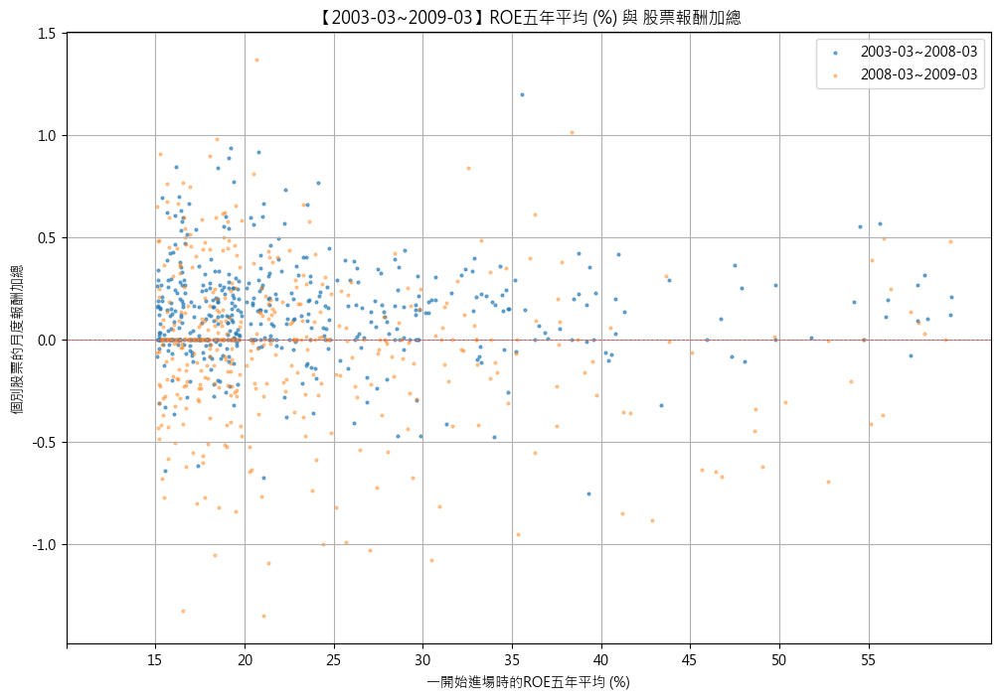

In [28]:
trades_cagr_analysis_split_returns(roe_15, roe_rol, 'ROE五年平均 (%)', N=0.1, 
                                       split_date='2008-03', start_date='2003-03', end_date='2009-03', data=data, remove=False, interval_range=(15, 55, 5), percentage=False)

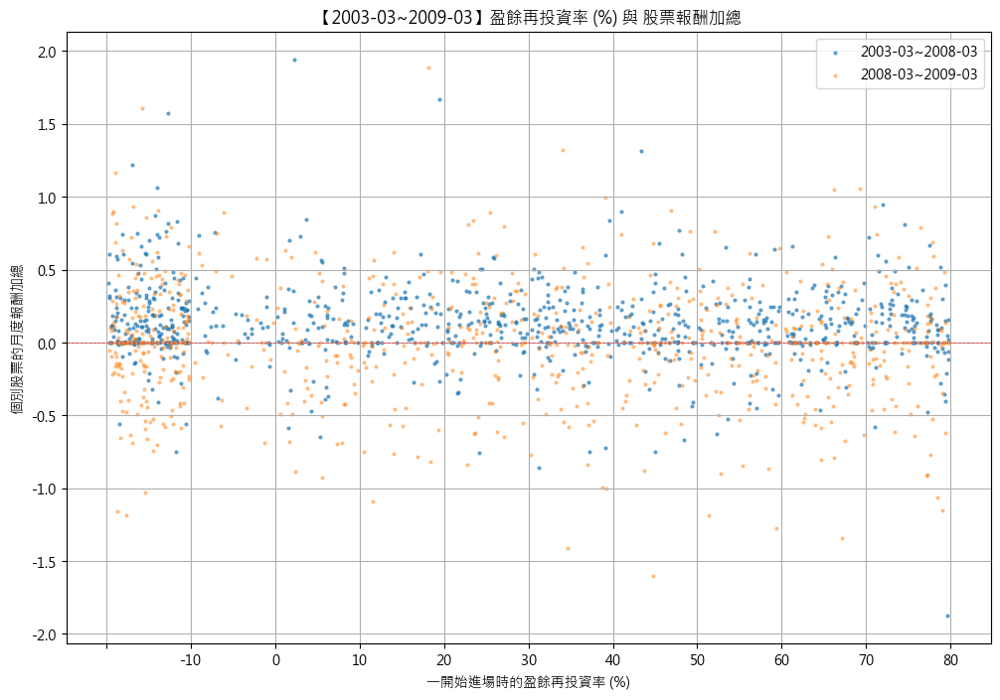

In [30]:
trades_cagr_analysis_split_returns(rr < 0.8, rr, '盈餘再投資率 (%)', N=0.1, 
                                       split_date='2008-03', start_date='2003-03', end_date='2009-03', data=data, remove=False, interval_range=(-10, 80, 10))

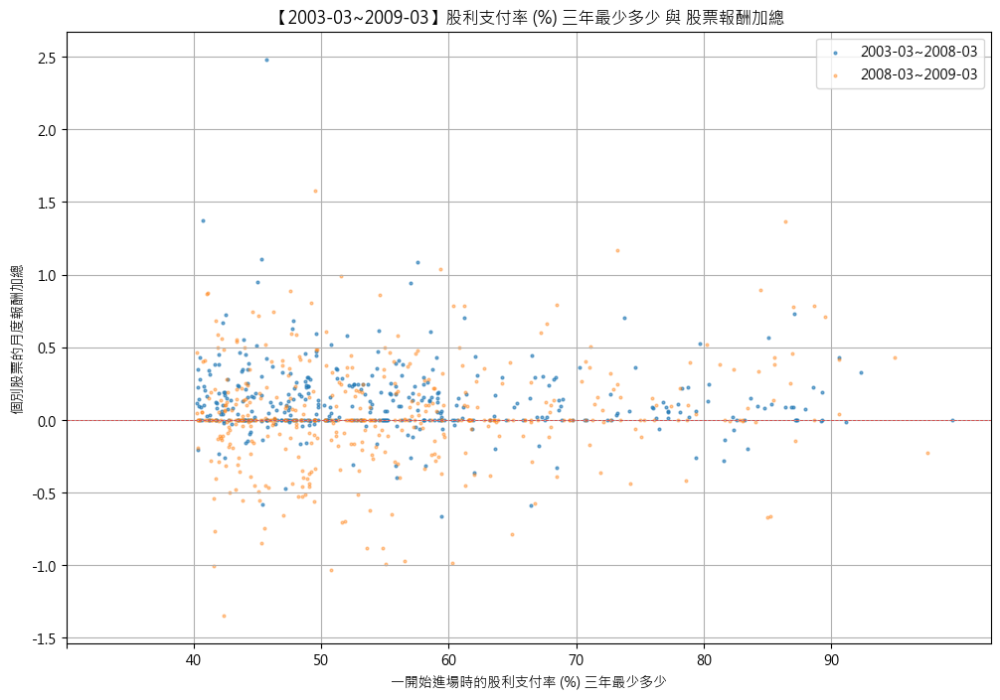

In [32]:
trades_cagr_analysis_split_returns(payout_ratio_cond, payout_ratio.rolling(3).min(), '股利支付率 (%) 三年最少多少', N=0.5, 
split_date='2008-03', start_date='2003-03', end_date='2009-03', data=data, remove=False, interval_range=(40, 90, 10), percentage=False)

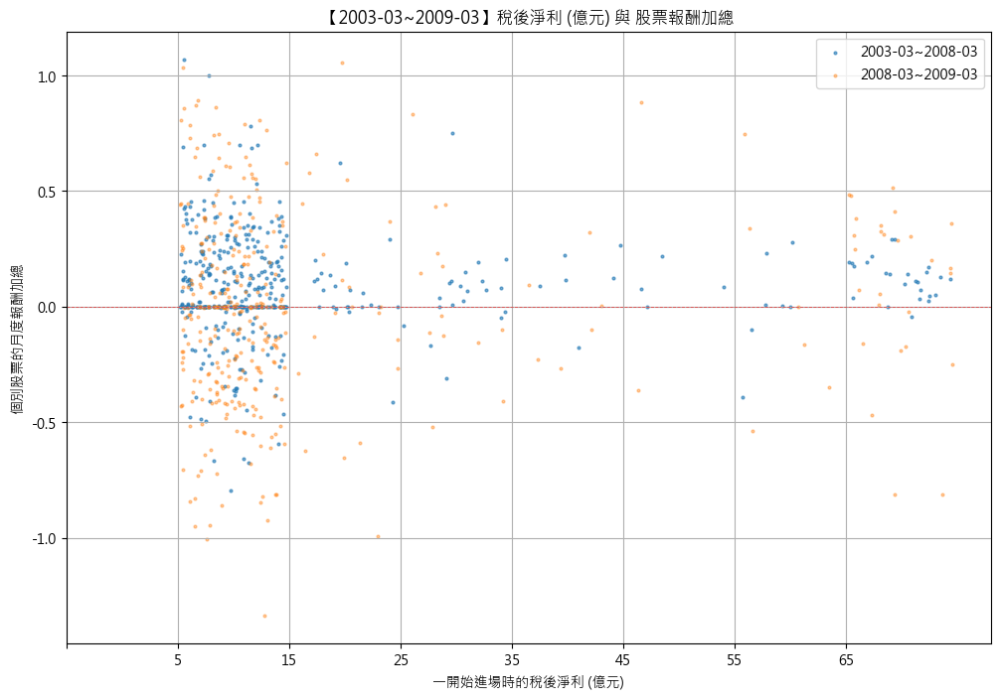

In [32]:
trades_cagr_analysis_split_returns(profit_cond, profit, '稅後淨利 (億元)', N=0.1, 
split_date='2008-03', start_date='2003-03', end_date='2009-03', data=data, remove=False,interval_range=(5, 65, 10),percentage=False)

---

## 布林通道

In [59]:
taiex_close = data.get('taiex:close')['2002-03':'2024-03']

In [60]:
upperband, middleband, lowerband = talib.BBANDS(taiex_close.close, timeperiod=300, nbdevup=2.0, nbdevdn=2.0)

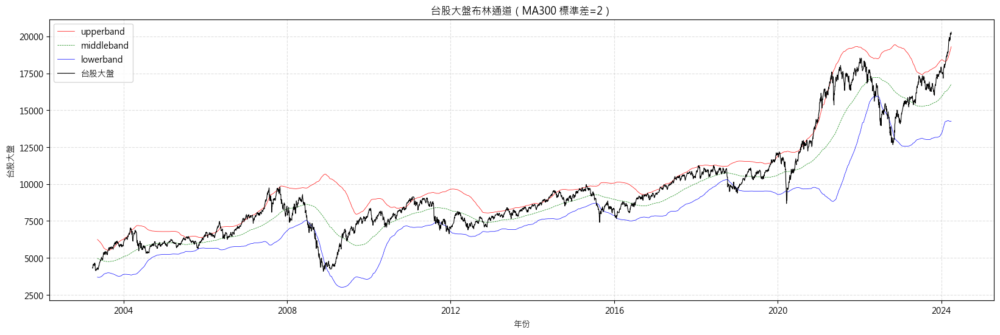

In [61]:
plt.figure(figsize=(20, 6))

plt.plot(upperband['2003-03-31':'2024-03-31'],
         label="upperband",color='r',
         linestyle='solid', linewidth=0.5)
plt.plot(middleband['2003-03-31':'2024-03-31'],
         label="middleband",color='g',linestyle='--', linewidth=0.5)
plt.plot(lowerband['2003-03-31':'2024-03-31'],
         label="lowerband",color='b',
         linestyle='solid', linewidth=0.5)
plt.plot(taiex_close['2003-03-31':'2024-03-31'],
         label="台股大盤",color='black', linewidth=0.8)



plt.title("台股大盤布林通道（MA300 標準差=2）") 
plt.xlabel("年份") 
plt.ylabel("台股大盤")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.show()

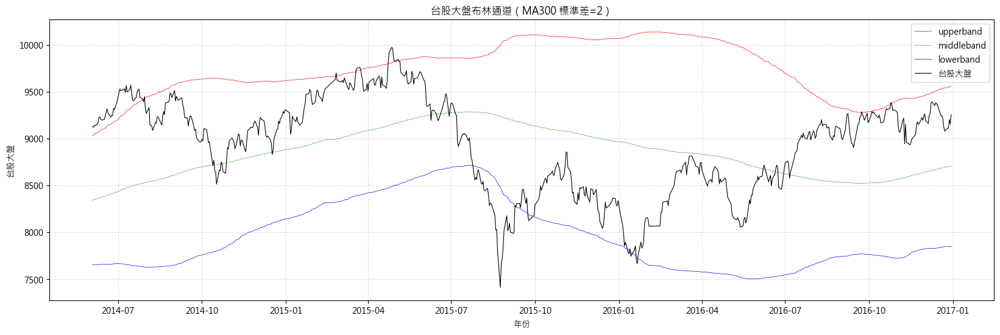

In [62]:
plt.figure(figsize=(20, 6))

plt.plot(upperband['2014-5-31':'2016'],
         label="upperband",color='r',
         linestyle='solid', linewidth=0.5)
plt.plot(middleband['2014-5-31':'2016'],
         label="middleband",color='g',linestyle='--', linewidth=0.5)
plt.plot(lowerband['2014-5-31':'2016'],
         label="lowerband",color='b',
         linestyle='solid', linewidth=0.5)
plt.plot(taiex_close['2014-5-31':'2016'],
         label="台股大盤",color='black', linewidth=0.8)



plt.title("台股大盤布林通道（MA300 標準差=2）") 
plt.xlabel("年份") 
plt.ylabel("台股大盤")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.show()

In [63]:
# 創建一個買賣訊號的DataFrame，初始值全部為True
tw_bollinger_signal_1 = pd.Series(True, index=taiex_close.index)

# 記錄第一次跌破的價格
first_break_price = None
# 記錄是否已經回到lower band之上
crossed_above_lower = False
# 是否進入持續的 False 狀態直到突破中通道
in_selling_state = False

# 遍歷所有的日期
for date in taiex_close.index:
    price = taiex_close.close[date]
    lower = lowerband[date]
    middle = middleband[date]
    
    # 第一次跌破下通道
    if price < lower and first_break_price is None:
        first_break_price = price
        crossed_above_lower = False
    
    # 價格回到下通道之上
    elif price > lower:
        crossed_above_lower = True
    
    # 再次跌破下通道且符合賣出條件
    if price < lower and crossed_above_lower and price < first_break_price:
        
        tw_bollinger_signal_1[date] = False
        in_selling_state = True
    
    # 突破中通道則重置狀態
    if price > middle:
        tw_bollinger_signal_1[date] = True
        first_break_price = None
        crossed_above_lower = False
        in_selling_state = False
    
    # 在突破中通道之前保持賣出狀態
    if in_selling_state and price <= middle:
        tw_bollinger_signal_1[date] = False

In [64]:
# tw_bollinger_signal_1.to_csv('./performance_file/TW/taiex_bollinger_trade_signal_1.csv')

- 2008\7\25出場，2009\5\6重新進場
- 2011\9\14出場，2012\3\2重新進場
- 2015\9\10出場，2016\6\6重新進場
- 2018\12\6出場，2019\3\20重新進場
- 2022\6\20出場，2023\3\6重新進場

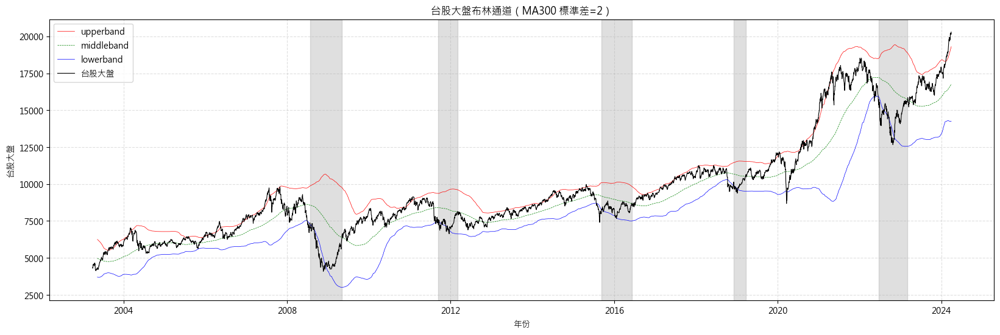

In [65]:
plt.figure(figsize=(20, 6))

plt.plot(upperband['2003-03-31':'2024-03-31'],
         label="upperband",color='r',
         linestyle='solid', linewidth=0.5)
plt.plot(middleband['2003-03-31':'2024-03-31'],
         label="middleband",color='g',linestyle='--', linewidth=0.5)
plt.plot(lowerband['2003-03-31':'2024-03-31'],
         label="lowerband",color='b',
         linestyle='solid', linewidth=0.5)
plt.plot(taiex_close['2003-03-31':'2024-03-31'],
         label="台股大盤",color='black', linewidth=0.8)

plt.axvspan(pd.Timestamp('2008-7-25'), pd.Timestamp('2009-5-5'), color='gray', alpha=0.25)
plt.axvspan(pd.Timestamp('2011-9-14'), pd.Timestamp('2012-3-1'), color='gray', alpha=0.25)
plt.axvspan(pd.Timestamp('2015-9-10'), pd.Timestamp('2016-6-6'), color='gray', alpha=0.25)
plt.axvspan(pd.Timestamp('2018-12-6'), pd.Timestamp('2019-3-19'), color='gray', alpha=0.25)
plt.axvspan(pd.Timestamp('2022-6-20'), pd.Timestamp('2023-3-3'), color='gray', alpha=0.25)

plt.title("台股大盤布林通道（MA300 標準差=2）") 
plt.xlabel("年份") 
plt.ylabel("台股大盤")

plt.legend()
plt.grid(True, linestyle='--', alpha=0.4)
plt.show()

---

## 原始條件 + 無本益比進出場條件

In [66]:
orig_all_cond = roe_15 & rr_cond & payout_ratio_cond & profit_cond & hold_cond & listed

---

## 原始條件 + 有本益比進出場

### 每季本益比進出場

In [67]:
# (每季)本益比條件

pe_cond_entry = pe < 12
pe_cond_exit = pe > 30

In [68]:
orig_all_cond_and_pe = (orig_all_cond[START_DATE:END_DATE] & pe_cond_entry[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit[START_DATE:END_DATE])

### **每月本益比進出場**

In [69]:
# 每日本益比resample成每月
daily_pe_resample = daily_pe.resample('M').last()

pe_cond_entry_daily = daily_pe_resample < 12
pe_cond_exit_daily = daily_pe_resample > 30

In [70]:
orig_all_cond_and_pe_daily = ((orig_all_cond[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE]))

# rep_all_cond_and_pe_daily = backtest.sim(orig_all_cond_and_pe_daily, resample='M', data=data)
# rep_all_cond_and_pe_daily.display()

In [71]:
# all_cond_pos_ret, all_cond_neg_ret = rep_all_cond_and_pe_daily.calc_returns_contrib(5)

---

In [72]:
bolling_1_filt = orig_all_cond.copy()

# 將 df 的 index 對齊 us_bollinger_signal_1 的 index，並填充為 True，這樣可以保證日期範圍內的所有日期都包括
aligned_signal = tw_bollinger_signal_1.reindex(bolling_1_filt.index, method='ffill', fill_value=True)

# 將 df 中日期對應的行設置為 aligned_signal 的值
bolling_1_filt.loc[aligned_signal.index, :] = aligned_signal.values[:, None]

---

## 綜合比較入選股數變化

In [73]:
all_cond_reps = {}

all_cond_reps['原始條件_無本益比'] = orig_all_cond[START_DATE:END_DATE]
all_cond_reps['原始條件_無本益比_ROE出場條件'] = orig_all_cond[START_DATE:END_DATE] & (roe[START_DATE:END_DATE] > 15)
all_cond_reps['原始條件_無本益比_布林通道'] = orig_all_cond[START_DATE:END_DATE] & bolling_1_filt[START_DATE:END_DATE]
all_cond_reps['原始條件_無本益比_ROE出場條件_布林通道'] = orig_all_cond[START_DATE:END_DATE] & bolling_1_filt[START_DATE:END_DATE] & (roe[START_DATE:END_DATE] > 15)

# all_cond_reps['原始條件_每季本益比'] = orig_all_cond_and_pe[START_DATE:END_DATE]
all_cond_reps['原始條件_有本益比'] = orig_all_cond_and_pe_daily[START_DATE:END_DATE]
all_cond_reps['原始條件_有本益比_ROE出場條件'] = (orig_all_cond[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 15))
all_cond_reps['原始條件_有本益比_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE] | ~bolling_1_filt[START_DATE:END_DATE])
all_cond_reps['原始條件_有本益比_ROE出場條件_布林通道'] = (orig_all_cond[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE] | ~bolling_1_filt[START_DATE:END_DATE] | (roe[START_DATE:END_DATE] < 15)) 


# all_cond_reps['原始條件_無本益比進出場_2009~2024'] = orig_all_cond['2009-3':'2024']
# all_cond_reps['原始條件_每季本益比_2009~2024'] = (orig_all_cond['2009-3':'2024'] & pe_cond_entry['2009-3':'2024']).hold_until((~orig_all_cond['2009-3':'2024']) | pe_cond_exit['2009-3':'2024'])
# all_cond_reps['原始條件_每日本益比_2009~2024'] = ((orig_all_cond['2009-3':'2024'] & pe_cond_entry_daily['2009-3':'2024']).hold_until((~orig_all_cond['2009-3':'2024']) | pe_cond_exit_daily['2009-3':'2024']))


rep_collecs = sim_conditions(all_cond_reps, resample='M', data=data)


# all_cond_reps_2003_09 = {}

# all_cond_reps_2003_09['原始條件_無本益比進出場_2003_09'] = orig_all_cond[START_DATE:END_DATE]
# all_cond_reps_2003_09['原始條件_每季本益比_2003_09'] = orig_all_cond_and_pe[START_DATE:END_DATE]
# all_cond_reps_2003_09['原始條件_每日本益比_2003_09'] = orig_all_cond_and_pe_daily[START_DATE:END_DATE]

# all_cond_reps_2009_24 = {}

# all_cond_reps_2009_24['原始條件_無本益比進出場_2009_24'] = orig_all_cond[2009:2024]
# all_cond_reps_2009_24['原始條件_每季本益比_2009_24'] = orig_all_cond_and_pe[2009:2024]
# all_cond_reps_2009_24['原始條件_每日本益比_2009_24'] = orig_all_cond_and_pe_daily[2009:2024]


# rep_collecs_2003_09 = sim_conditions(all_cond_reps_2003_09, resample='M', data=data)
# rep_collecs_2009_24 = sim_conditions(all_cond_reps_2009_24, resample='M', data=data)


Backtesting progress: 100%|██████████| 8/8 [00:10<00:00,  1.31s/condition]


In [74]:
rep_collecs.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
原始條件_有本益比_ROE出場條件,13.85,-55.26,29.25,31.0,23.0,37.0,1.0,56.0
原始條件_有本益比,13.65,-55.18,35.66,36.0,30.0,43.0,2.0,63.0
原始條件_無本益比_ROE出場條件,13.46,-54.67,46.84,47.0,39.0,59.0,2.0,88.0
原始條件_無本益比,12.92,-53.93,55.48,58.0,54.0,71.0,3.0,100.0
原始條件_有本益比_ROE出場條件_布林通道,10.53,-31.49,19.62,19.0,11.0,32.0,0.0,49.0
原始條件_有本益比_布林通道,10.49,-31.18,23.42,27.0,14.0,35.0,0.0,56.0
原始條件_無本益比_ROE出場條件_布林通道,10.28,-29.63,38.03,45.0,19.0,54.0,0.0,88.0
原始條件_無本益比_布林通道,9.75,-29.66,45.35,56.0,20.0,64.0,0.0,100.0


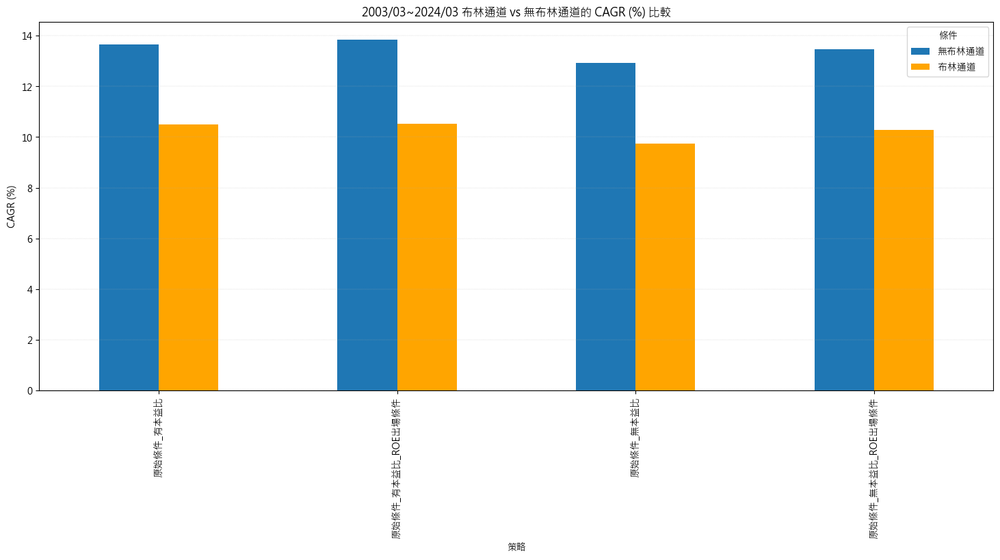

In [75]:
df = rep_collecs.selected_stock_count_analysis().reset_index()

# 提取策略前綴，移除 '_布林通道' 作為分組依據
df["Base_Strategy"] = df["Strategy"].str.replace("_布林通道", "", regex=False)
df["Condition"] = df["Strategy"].str.contains("_布林通道")  # 判斷是否包含 '_布林通道'

# 計算有無布林通道的績效差異
comparison_df = df.pivot_table(
    index="Base_Strategy",  # 使用策略前綴作為索引
    columns="Condition",
    values="CAGR (%)"
)

# 調整列名，便於圖表呈現
comparison_df.columns = ["無布林通道", "布林通道"]
comparison_df = comparison_df.reset_index()

# 繪製條形圖
ax = comparison_df.plot(
    x="Base_Strategy",
    kind="bar",
    figsize=(18, 7),
    title="2003/03~2024/03 布林通道 vs 無布林通道的 CAGR (%) 比較",
    ylabel="CAGR (%)",
    xlabel="策略",
    rot=90,
    color=['tab:blue', 'orange']
)

# 調整圖例
plt.legend(["無布林通道", "布林通道"], title="條件")
# plt.tight_layout()
plt.grid(axis='y', alpha=0.6, linestyle='--', linewidth=0.3)
plt.show()

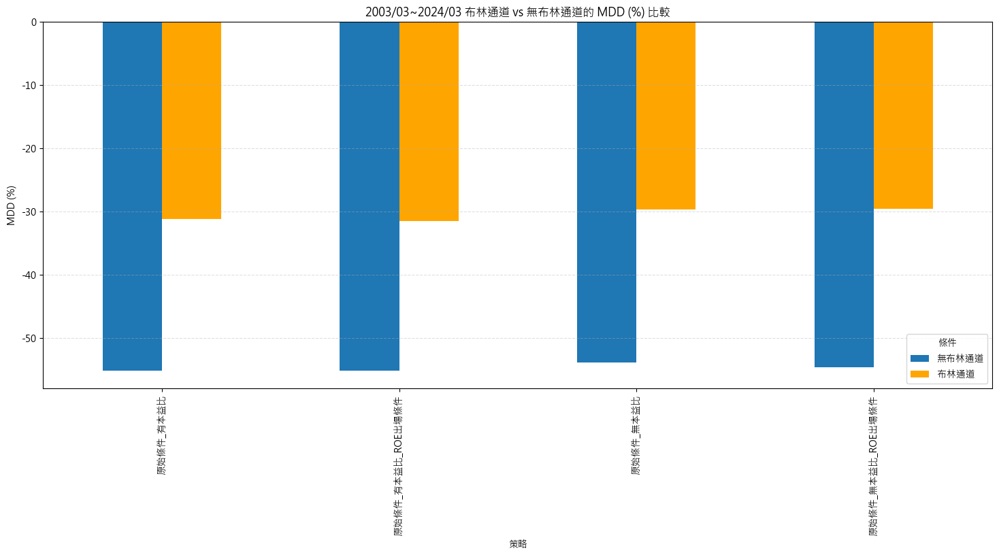

In [76]:
# 提取策略前綴，移除 '_布林通道' 作為分組依據
df["Base_Strategy"] = df["Strategy"].str.replace("_布林通道", "", regex=False)
df["Condition"] = df["Strategy"].str.contains("_布林通道")  # 判斷是否包含 '_布林通道'

# 計算有無布林通道的績效差異
comparison_df = df.pivot_table(
    index="Base_Strategy",  # 使用策略前綴作為索引
    columns="Condition",
    values="MDD (%)"
)

# 調整列名，便於圖表呈現
comparison_df.columns = ["無布林通道", "布林通道"]
comparison_df = comparison_df.reset_index()

# 繪製條形圖
ax = comparison_df.plot(
    x="Base_Strategy",
    kind="bar",
    figsize=(18, 7),
    title="2003/03~2024/03 布林通道 vs 無布林通道的 MDD (%) 比較",
    ylabel="MDD (%)",
    xlabel="策略",
    rot=90,
    color=['tab:blue', 'orange']
)

# 調整圖例
plt.legend(["無布林通道", "布林通道"], title="條件")
# plt.tight_layout()
plt.grid(axis='y', alpha=0.4, linestyle='--')
plt.show()

In [38]:
rep_collecs.plot_creturns()

In [39]:
rep_collecs.reports['原始條件_有本益比_布林通道'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,10.49%,34.55,-31.18%,55.33%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
4952,2023-04-06,2023-12-01,2023-03-31,2023-11-30,0.026316,164,5758,5922,0.059213,-8.000008e-02,0.086058,0.024389,-0.101904,31.0,0.000000,0.000000
8155,2023-04-06,2023-12-01,2023-03-31,2023-11-30,0.026316,164,5758,5922,0.216888,-1.550587e-02,0.445734,0.000000,-0.316674,160.0,0.000000,0.000000
2059,2023-04-06,2024-02-01,2023-03-31,2024-01-31,0.026316,207,5758,5965,1.822981,0.000000e+00,1.882445,0.000000,-0.310652,207.0,0.000000,0.000000
1527,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.212511,-5.471480e-02,0.248172,0.011642,-0.087372,186.0,0.025641,0.025641
2373,2023-11-01,NaT,2023-10-31,NaT,0.023810,223,5900,-1,-0.006038,-3.780765e-02,0.054794,0.054794,-0.087791,176.0,0.025641,0.025641
2385,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.908966,-2.185226e-02,1.896825,0.007283,-0.415575,353.0,0.025641,0.025641
2404,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.721892,-2.220446e-16,1.208033,0.030953,-0.256766,362.0,0.025641,0.025641
2420,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.939950,-7.991128e-03,0.997140,0.026255,-0.214186,363.0,0.025641,0.025641
2441,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.199441,-2.412024e-02,0.277985,0.018551,-0.123839,350.0,0.025641,0.025641


In [40]:
rep_collecs.reports['原始條件_有本益比'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,13.65%,24.62,-55.18%,59.66%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
4952,2022-06-01,2023-12-01,2022-05-31,2023-11-30,0.016949,368,5554,5922,-0.192461,-4.411949e-01,0.009853,0.009853,-0.446647,1.0,0.00,0.00
8155,2023-04-06,2023-12-01,2023-03-31,2023-11-30,0.016129,164,5758,5922,0.216888,-1.550587e-02,0.445734,0.000000,-0.316674,160.0,0.00,0.00
2059,2023-04-06,2024-02-01,2023-03-31,2024-01-31,0.016129,207,5758,5965,1.822981,0.000000e+00,1.882445,0.000000,-0.310652,207.0,0.00,0.00
3131,2022-07-01,2024-02-01,2022-06-30,2024-01-31,0.016129,390,5575,5965,2.218605,-1.357639e-01,2.372183,0.426363,-0.394098,364.0,0.00,0.00
6669,2022-12-01,2024-02-01,2022-11-30,2024-01-31,0.016393,283,5682,5965,1.549821,-1.848925e-01,1.632221,0.058625,-0.354609,244.0,0.00,0.00
3324,2020-04-01,2024-03-01,2020-03-31,2024-02-29,0.023810,953,5025,5978,3.901533,0.000000e+00,3.907383,0.000000,-0.525168,953.0,0.00,0.00
1232,2010-05-03,NaT,2010-04-30,NaT,0.029412,3541,2582,-1,6.871704,-3.780169e-02,6.987364,0.000000,-0.286155,3503.0,0.02,0.02
1527,2023-04-06,NaT,2023-03-31,NaT,0.016129,365,5758,-1,0.212511,-5.471480e-02,0.248172,0.011642,-0.087372,186.0,0.02,0.02
1537,2013-05-02,NaT,2013-04-30,NaT,0.027778,2795,3328,-1,3.692059,-1.700017e-02,3.901485,0.000000,-0.299662,2791.0,0.02,0.02


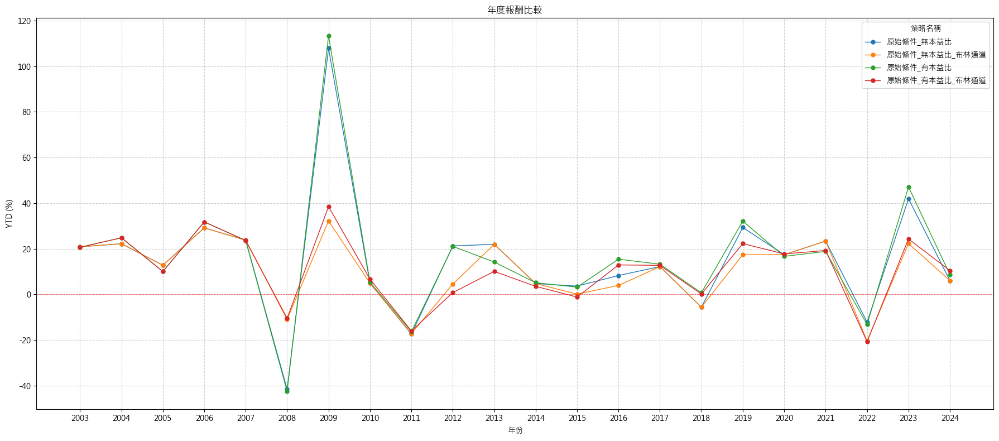

In [41]:
def visualize_ytd_performance(rep_collecs, selected_strategies=None):
    """
    可視化指定策略的逐年YTD報酬。

    參數:
        rep_collecs: 包含策略數據的資料結構。
        selected_strategies: 要視覺化的策略名稱列表，若為None則顯示所有策略。

    回傳:
        無 (直接顯示圖表)
    """
    strategy_names = list(rep_collecs.reports.keys())
    if selected_strategies:
        strategy_names = [strategy for strategy in strategy_names if strategy in selected_strategies]
    
    yearly_ytd = {}

    # 收集所有年份的數據
    for strategy in strategy_names:
        for year, values in rep_collecs.reports[strategy].return_table.items():
            if year not in yearly_ytd:
                yearly_ytd[year] = {}
            yearly_ytd[year][strategy] = values['YTD'] * 100  # 轉換為百分比

    # 準備繪圖
    plt.figure(figsize=(18, 8))
    years = sorted(yearly_ytd.keys())

    for strategy in strategy_names:
        ytd_values = [yearly_ytd[year].get(strategy, None) for year in years]
        plt.plot(years, ytd_values, label=strategy, marker='o', markersize=5, linewidth=1)

    # 設置圖表屬性
    plt.xticks(years)
    plt.axhline(y=0, color='r', linestyle='--', linewidth=0.6, alpha=0.6)
    plt.title('年度報酬比較')
    plt.xlabel('年份')
    plt.ylabel('YTD (%)')
    plt.legend(title='策略名稱')
    plt.grid(True, linestyle='--', alpha=0.6)
    plt.tight_layout()

    # 顯示圖表
    plt.show()


# 測試函數 (可以傳入策略名稱的列表來篩選)
visualize_ytd_performance(rep_collecs, selected_strategies=['原始條件_無本益比', '原始條件_有本益比', '原始條件_無本益比_布林通道', '原始條件_有本益比_布林通道'])


In [42]:
# rep_collecs.plot_creturns()

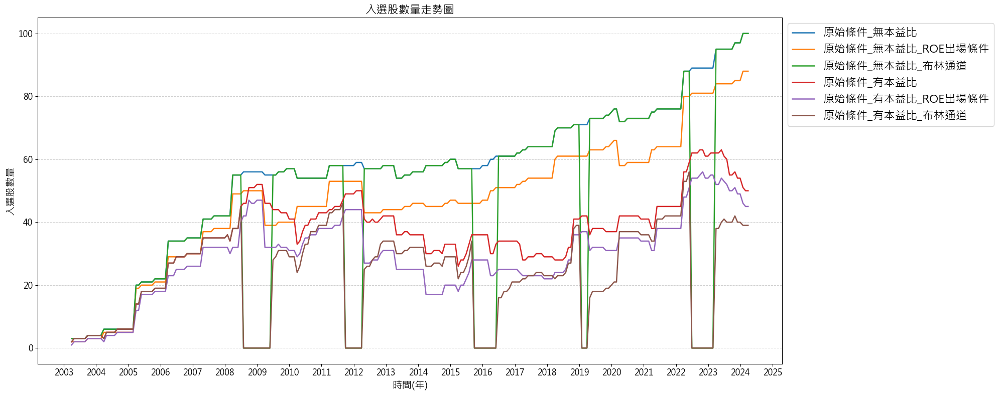

In [43]:
rep_collecs.plot_reps_stock_counts()

In [44]:
rep_collecs.reports['原始條件_有本益比_布林通道'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,10.49%,34.55,-31.18%,55.33%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
4952,2023-04-06,2023-12-01,2023-03-31,2023-11-30,0.026316,164,5758,5922,0.059213,-8.000008e-02,0.086058,0.024389,-0.101904,31.0,0.000000,0.000000
8155,2023-04-06,2023-12-01,2023-03-31,2023-11-30,0.026316,164,5758,5922,0.216888,-1.550587e-02,0.445734,0.000000,-0.316674,160.0,0.000000,0.000000
2059,2023-04-06,2024-02-01,2023-03-31,2024-01-31,0.026316,207,5758,5965,1.822981,0.000000e+00,1.882445,0.000000,-0.310652,207.0,0.000000,0.000000
1527,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.212511,-5.471480e-02,0.248172,0.011642,-0.087372,186.0,0.025641,0.025641
2373,2023-11-01,NaT,2023-10-31,NaT,0.023810,223,5900,-1,-0.006038,-3.780765e-02,0.054794,0.054794,-0.087791,176.0,0.025641,0.025641
2385,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.908966,-2.185226e-02,1.896825,0.007283,-0.415575,353.0,0.025641,0.025641
2404,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.721892,-2.220446e-16,1.208033,0.030953,-0.256766,362.0,0.025641,0.025641
2420,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.939950,-7.991128e-03,0.997140,0.026255,-0.214186,363.0,0.025641,0.025641
2441,2023-04-06,NaT,2023-03-31,NaT,0.026316,365,5758,-1,0.199441,-2.412024e-02,0.277985,0.018551,-0.123839,350.0,0.025641,0.025641


<Axes: xlabel='date'>

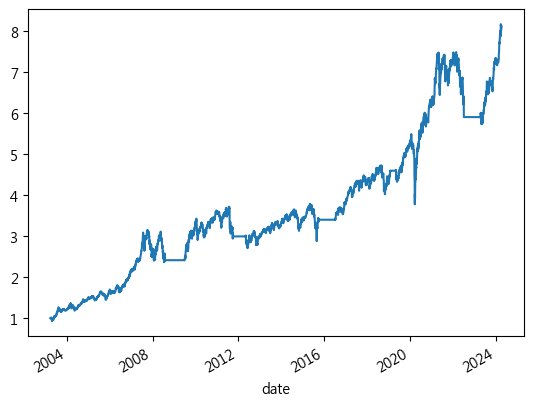

In [ ]:
# rep_collecs.reports['原始條件_有本益比_布林通道'].cashflow.sum(axis=1).plot()

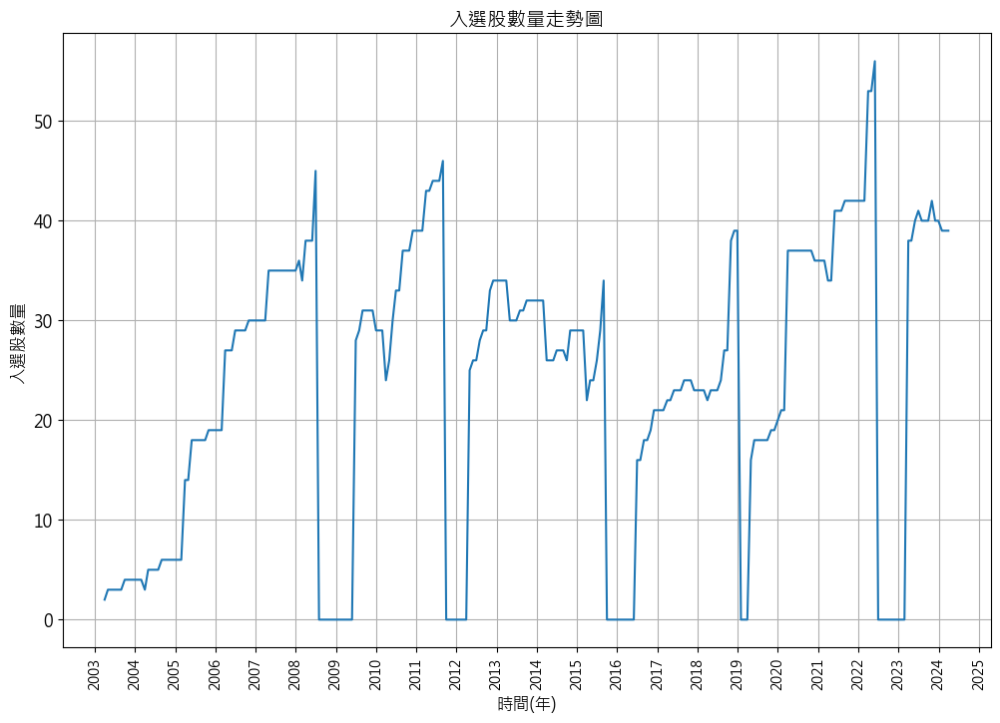

In [45]:
rep_collecs.reports['原始條件_有本益比_布林通道'].plot_company_counts()

In [46]:
# rep_collecs.reports['原始條件_有本益比_布林通道'].return_table

In [47]:
# rep_collecs.reports['原始條件_每日本益比_2009~2024'].display()

In [48]:
# rep_collecs.reports['原始條件_無本益比進出場'].trades.sort_values('period', ascending=False)

### MDD 比較

In [49]:
rep_collecs.reports['原始條件_有本益比_布林通道'].benchmark.close['2003-3-31':]

date
2003-03-31     4321.22
2003-04-01     4337.61
2003-04-02     4311.56
2003-04-03     4358.39
2003-04-04     4499.18
                ...   
2024-09-24    22431.80
2024-09-25    22761.60
2024-09-26    22858.80
2024-09-27    22822.80
2024-09-30    22224.50
Name: close, Length: 5305, dtype: float64

In [50]:
# rep_all_cond_MDD = rep_all_cond.calc_dd(rep_all_cond.stock_data['portfolio_returns'])*100
rep_all_cond_and_pe_MDD = rep_collecs.reports['原始條件_有本益比'].calc_dd(rep_collecs.reports['原始條件_有本益比'].stock_data['portfolio_returns'])*100
rep_all_cond_and_pe_bolling_MDD = rep_collecs.reports['原始條件_有本益比_布林通道'].calc_dd(rep_collecs.reports['原始條件_有本益比_布林通道'].stock_data['portfolio_returns'])*100
benchmark_MDD = rep_collecs.reports['原始條件_有本益比_布林通道'].calc_dd(rep_collecs.reports['原始條件_有本益比_布林通道'].benchmark.close['2003-3-31':])*100

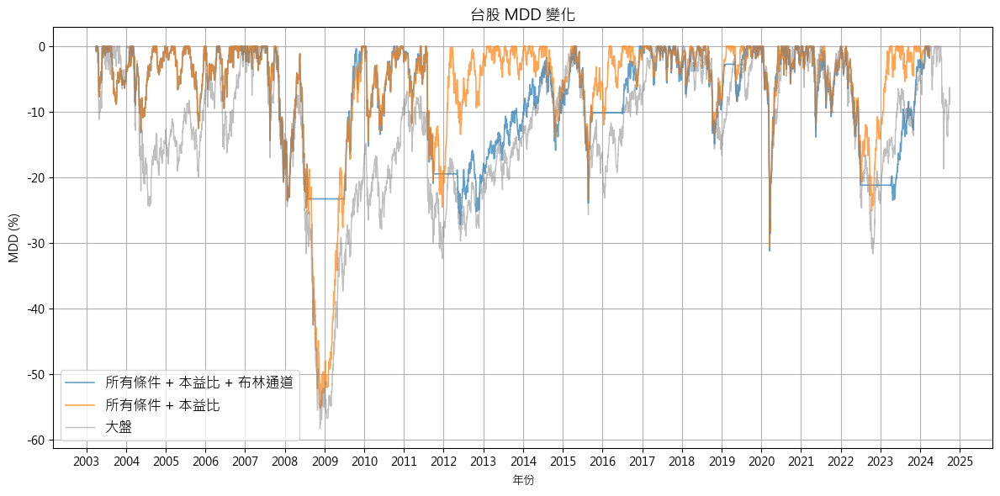

In [51]:
plt.figure(figsize=(12, 6))

plt.plot(rep_all_cond_and_pe_bolling_MDD.index, rep_all_cond_and_pe_bolling_MDD.values, label='所有條件 + 本益比 + 布林通道', alpha=0.7, linewidth=1.2)
plt.plot(rep_all_cond_and_pe_MDD.index, rep_all_cond_and_pe_MDD.values, label='所有條件 + 本益比', alpha=0.7, linewidth=1.2)
plt.plot(benchmark_MDD.index, benchmark_MDD.values, label='大盤', alpha=0.5, linewidth=1, color='gray')

plt.title('台股 MDD 變化', fontsize=13)
plt.xlabel('年份')
plt.ylabel('MDD (%)')

plt.legend(fontsize=12)
plt.grid()

plt.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.gca().xaxis.set_major_formatter(mdates.DateFormatter('%Y'))

# plt.xticks(rotation=90)

plt.tight_layout()
plt.show()

---

## GDP年增率

In [52]:
# gdp_yoy_df = pd.read_csv('./macro_indicators/台灣_GDP年增率_季.csv', encoding='cp950')

In [53]:
# gdp_yoy_df = gdp_yoy_df.drop(columns=['證券代碼'])

In [54]:
# gdp_yoy_df

,年,月,數值
0,2000,3,6.0208
1,2000,6,6.2700
2,2000,9,7.1898
3,2000,12,5.7818
4,2001,3,1.4502
...,...,...,...
92,2023,3,-3.4879
93,2023,6,1.4071
94,2023,9,2.1479
95,2023,12,4.8313


In [55]:
# from pandas.tseries.offsets import MonthEnd, BDay

# def get_end_of_month_date(row):
#     year = int(row['年'])
#     month = int(row['月'])
#     if month == 3:
#         target_date = pd.Timestamp(year, 5, 1) + MonthEnd(0)  # 該年五月底
#     elif month == 6:
#         target_date = pd.Timestamp(year, 8, 1) + MonthEnd(0)  # 該年八月底
#     elif month == 9:
#         target_date = pd.Timestamp(year, 11, 1) + MonthEnd(0)  # 該年11月底
#     elif month == 12:
#         target_date = pd.Timestamp(year + 1, 2, 1) + MonthEnd(0)  # 下一年二月底
#     else:
#         return pd.NaT

#     # 確保日期是非假日，如果是週末則取前一個工作日
#     while target_date.weekday() >= 5:  # 5: Saturday, 6: Sunday
#         target_date -= BDay(1)
#     return target_date

In [56]:
# gdp_yoy_df['date'] = gdp_yoy_df.apply(get_end_of_month_date, axis=1)

In [57]:
# gdp_yoy_data = gdp_yoy_df.set_index('date', inplace=False)

In [58]:
# gdp_yoy_data.drop(columns=['年', '月'], inplace=True)
# gdp_yoy_data.rename(columns={'數值': 'gdp_yoy'}, inplace=True)

In [63]:
# gdp_yoy_data

,gdp_yoy
date,
2000-05-31,6.0208
2000-08-31,6.2700
2000-11-30,7.1898
2001-02-28,5.7818
2001-05-31,1.4502
...,...
2023-05-31,-3.4879
2023-08-31,1.4071
2023-11-30,2.1479


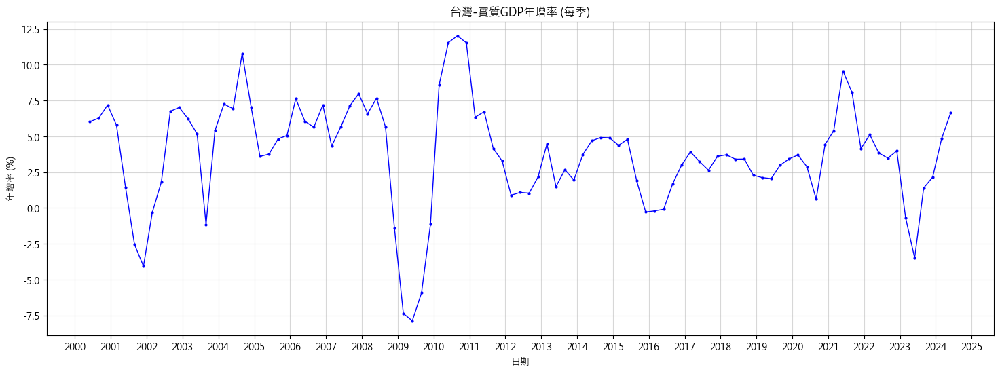

In [59]:
# plt.figure(figsize=(18, 6))
# plt.plot(gdp_yoy_data['gdp_yoy'], label='GDP年增率', color='b', linewidth=1, marker='o', markersize=2)
# plt.title('台灣-實質GDP年增率 (每季)')
# plt.xlabel('日期')
# plt.ylabel('年增率 (%)')
# plt.axhline(y=0, color='r', linestyle='--', linewidth=0.6, alpha=0.6)
# plt.gca().xaxis.set_major_locator(mdates.YearLocator())
# plt.grid(alpha=0.5)
# plt.show()

In [60]:
# gdp_yoy_data.to_csv('./macro_indicators/台灣_GDP年增率_日期調整.csv')

In [61]:
# # 找到兩個數據集的共同起始日期
# common_start_date = max(taiex_close.index.min(), gdp_yoy_data.index.min())

# # 截取兩個數據集以相同的起始日期開始
# taiex_close = taiex_close[taiex_close.index >= common_start_date]
# gdp_yoy_data = gdp_yoy_data[gdp_yoy_data.index >= common_start_date]

# # 正規化兩個數據集，讓它們從相同的 Y=0 開始
# taiex_close_normalized = (taiex_close['close'] / taiex_close['close'].iloc[0]) * 100 - 100
# gdp_yoy_normalized = (gdp_yoy_data['gdp_yoy'] / gdp_yoy_data['gdp_yoy'].iloc[0]) * 100 - 100

# # 讓兩個 Y 軸的 0 對齊
# fig, ax1 = plt.subplots(figsize=(10, 6))

# # 繪製 taiex_close 折線圖，正規化後的數據
# ax1.plot(taiex_close.index, taiex_close_normalized, color='b', label='TAIEX Close (Normalized)')
# ax1.set_xlabel('Date')
# ax1.set_ylabel('TAIEX Close (Normalized %)', color='b')
# ax1.tick_params(axis='y', labelcolor='b')
# ax1.axhline(y=0, color='black', linestyle='--', linewidth=1)  # 確保 Y=0 的水平線顯示
# ax1.set_ylim(min(taiex_close_normalized.min(), gdp_yoy_normalized.min()), max(taiex_close_normalized.max(), gdp_yoy_normalized.max()))

# # 新增第二個 y 軸來繪製 gdp_yoy，正規化後的數據
# ax2 = ax1.twinx()
# ax2.plot(gdp_yoy_data.index, gdp_yoy_normalized, color='g', label='GDP YoY (Normalized)')
# ax2.set_ylabel('GDP YoY (Normalized %)', color='g')
# ax2.tick_params(axis='y', labelcolor='g')
# ax2.axhline(y=0, color='black', linestyle='--', linewidth=1)  # 確保 Y=0 的水平線顯示
# ax2.set_ylim(ax1.get_ylim())  # 讓兩個 Y 軸的 0 對齊

# # 加上圖例
# fig.tight_layout()
# plt.title('TAIEX Close and GDP YoY (Normalized to Start from Y=0)')
# plt.show()


In [ ]:
# # 創建布林通道訊號標記
# upper_break_dates = []  # 用於記錄突破上通道的日期
# lower_break_dates = []  # 用於記錄跌破下通道的日期

# # 遍歷所有日期
# for date in taiex_close['2003-03-31':'2024-03-31'].index:
#     price = taiex_close.loc[date, 'close']  # 收盤價
#     upper = upperband[date]                # 上通道
#     lower = lowerband[date]                # 下通道

#     # 突破上通道
#     if price > upper:
#         upper_break_dates.append(date)

#     # 跌破下通道
#     if price < lower:
#         lower_break_dates.append(date)


# # 將兩個結果分別轉為 DataFrame
# upper_break_df = pd.DataFrame({
#     "Upper Breakout Dates": upper_break_dates
# })
# lower_break_df = pd.DataFrame({
#     "Lower Breakout Dates": lower_break_dates
# })

# # 輸出結果
# print("突破上通道的日期:")
# # print(upper_break_df)

# print("\n跌破下通道的日期:")
# # print(lower_break_df)

突破上通道的日期:
    Upper Breakout Dates
0             2003-08-18
1             2003-08-19
2             2003-08-20
3             2003-08-21
4             2003-08-22
..                   ...
575           2024-03-25
576           2024-03-26
577           2024-03-27
578           2024-03-28
579           2024-03-29

[580 rows x 1 columns]

跌破下通道的日期:
    Lower Breakout Dates
0             2008-07-01
1             2008-07-02
2             2008-07-03
3             2008-07-04
4             2008-07-07
..                   ...
313           2022-10-31
314           2022-11-01
315           2022-11-02
316           2022-11-03
317           2022-11-04

[318 rows x 1 columns]


In [ ]:
# upper_break_df.to_csv('./performance_file/TW/taiex_upper_break_dates.csv')
# lower_break_df.to_csv('./performance_file/TW/taiex_lower_break_dates.csv')

In [105]:
# def find_high_points(data):
#     # Ensure the index is datetime for easier manipulation
#     data.index = pd.to_datetime(data.index)
#     data = data.sort_index()  # Ensure data is sorted by date
    
#     # Add 'year' and 'month' columns for easier filtering
#     data['year'] = data.index.year
#     data['month'] = data.index.month

#     result_dates = []

#     # Iterate through the rows to find high points
#     for i in range(1, len(data)):
#         current_row = data.iloc[i]
#         previous_row = data.iloc[i - 1]
        
#         # Check if current value is greater than previous value
#         if current_row['gdp_yoy'] > previous_row['gdp_yoy']:
#             # Find the corresponding date last year
#             last_year = current_row['year'] - 1
#             last_year_same_month = data[(data['year'] == last_year) & (data['month'] == current_row['month'])]
            
#             # Check if the value last year is the lowest of that year
#             if not last_year_same_month.empty:
#                 last_year_value = last_year_same_month.iloc[0]['gdp_yoy']
#                 if last_year_value == data[data['year'] == last_year]['gdp_yoy'].min():
#                     result_dates.append(data.index[i])

#     return result_dates

# # Apply the function to the provided dataset
# high_points = find_high_points(gdp_yoy_data)

# # Print the results
# high_points


[Timestamp('2002-11-29 00:00:00'),
 Timestamp('2004-08-31 00:00:00'),
 Timestamp('2005-05-31 00:00:00'),
 Timestamp('2006-02-28 00:00:00'),
 Timestamp('2007-08-31 00:00:00'),
 Timestamp('2009-11-30 00:00:00'),
 Timestamp('2010-05-31 00:00:00'),
 Timestamp('2012-11-30 00:00:00'),
 Timestamp('2013-02-28 00:00:00'),
 Timestamp('2014-05-30 00:00:00'),
 Timestamp('2016-11-30 00:00:00'),
 Timestamp('2017-02-28 00:00:00'),
 Timestamp('2018-08-31 00:00:00'),
 Timestamp('2019-11-29 00:00:00'),
 Timestamp('2022-11-30 00:00:00'),
 Timestamp('2023-08-31 00:00:00'),
 Timestamp('2024-05-31 00:00:00')]

In [107]:
# def find_high_points_two_prior(data):
#     # Ensure the index is datetime for easier manipulation
#     data.index = pd.to_datetime(data.index)
#     data = data.sort_index()  # Ensure data is sorted by date
    
#     # Add 'year' and 'month' columns for easier filtering
#     data['year'] = data.index.year
#     data['month'] = data.index.month

#     result_dates = []

#     # Iterate through the rows to find high points
#     for i in range(2, len(data)):  # Start from the third row to access two prior rows
#         current_row = data.iloc[i]
#         previous_row = data.iloc[i - 1]
#         two_prior_row = data.iloc[i - 2]
        
#         # Check if current value is greater than both previous and two prior values
#         if current_row['gdp_yoy'] > previous_row['gdp_yoy'] and current_row['gdp_yoy'] > two_prior_row['gdp_yoy']:
#             # Find the corresponding date last year
#             last_year = current_row['year'] - 1
#             last_year_same_month = data[(data['year'] == last_year) & (data['month'] == current_row['month'])]
            
#             # Check if the value last year is the lowest of that year
#             if not last_year_same_month.empty:
#                 last_year_value = last_year_same_month.iloc[0]['gdp_yoy']
#                 if last_year_value == data[data['year'] == last_year]['gdp_yoy'].min():
#                     result_dates.append(data.index[i])

#     return result_dates

# # Apply the new function to the provided dataset
# high_points_two_prior = find_high_points_two_prior(gdp_yoy_data)

# # Print the results
# high_points_two_prior


[Timestamp('2002-11-29 00:00:00'),
 Timestamp('2004-08-31 00:00:00'),
 Timestamp('2006-02-28 00:00:00'),
 Timestamp('2007-08-31 00:00:00'),
 Timestamp('2009-11-30 00:00:00'),
 Timestamp('2010-05-31 00:00:00'),
 Timestamp('2012-11-30 00:00:00'),
 Timestamp('2013-02-28 00:00:00'),
 Timestamp('2014-05-30 00:00:00'),
 Timestamp('2016-11-30 00:00:00'),
 Timestamp('2017-02-28 00:00:00'),
 Timestamp('2019-11-29 00:00:00'),
 Timestamp('2022-11-30 00:00:00'),
 Timestamp('2023-08-31 00:00:00'),
 Timestamp('2024-05-31 00:00:00')]

In [106]:
# def find_low_points(data):
#     # Ensure the index is datetime for easier manipulation
#     data.index = pd.to_datetime(data.index)
#     data = data.sort_index()  # Ensure data is sorted by date
    
#     # Add 'year' and 'month' columns for easier filtering
#     data['year'] = data.index.year
#     data['month'] = data.index.month

#     result_dates = []

#     # Iterate through the rows to find low points
#     for i in range(1, len(data)):
#         current_row = data.iloc[i]
#         previous_row = data.iloc[i - 1]
        
#         # Check if current value is less than previous value
#         if current_row['gdp_yoy'] < previous_row['gdp_yoy']:
#             # Find the corresponding date last year
#             last_year = current_row['year'] - 1
#             last_year_same_month = data[(data['year'] == last_year) & (data['month'] == current_row['month'])]
            
#             # Check if the value last year is the highest of that year
#             if not last_year_same_month.empty:
#                 last_year_value = last_year_same_month.iloc[0]['gdp_yoy']
#                 if last_year_value == data[data['year'] == last_year]['gdp_yoy'].max():
#                     result_dates.append(data.index[i])

#     return result_dates

# # Apply the function to the provided dataset
# low_points = find_low_points(gdp_yoy_data)

# # Print the results
# low_points


[Timestamp('2001-11-30 00:00:00'),
 Timestamp('2007-02-28 00:00:00'),
 Timestamp('2008-11-28 00:00:00'),
 Timestamp('2009-05-29 00:00:00'),
 Timestamp('2010-11-30 00:00:00'),
 Timestamp('2011-08-31 00:00:00'),
 Timestamp('2013-11-29 00:00:00'),
 Timestamp('2015-08-31 00:00:00'),
 Timestamp('2019-02-28 00:00:00'),
 Timestamp('2021-11-30 00:00:00'),
 Timestamp('2022-05-31 00:00:00'),
 Timestamp('2023-02-28 00:00:00')]

---

# 暫時忽略

## ROE 參數最佳化 + 有無本益比進出場

In [40]:
pe_cond_entry = daily_pe_resample < 12
pe_cond_exit = daily_pe_resample > 30



roe_value_pe = {}
no_roe_conds = rr_cond & profit_cond & hold_cond & listed & payout_ratio_cond

for i in range(10, 26, 5): # 大於 10~25%
    for n in range(3, 6): # 3, 4, 5年平均
        
        roe_rolling = roe.rolling(n).mean()
        roe_cond_opt = (roe_rolling > i) # [START_DATE:END_DATE]

        roe_value_pe[f'roe_{n}y_{i} 無本益比進出場'] = (roe_cond_opt & no_roe_conds)[START_DATE:END_DATE]

        roe_value_pe[f'roe_{n}y_{i} 有本益比進出場'] = ((roe_cond_opt[START_DATE:END_DATE] &  no_roe_conds[START_DATE:END_DATE] & pe_cond_entry[START_DATE:END_DATE]).hold_until((~(roe_cond_opt[START_DATE:END_DATE] &  no_roe_conds[START_DATE:END_DATE])) | pe_cond_exit[START_DATE:END_DATE]))

        # roe_value_pe[f'roe_{n}y_{i}'] = ((roe_cond_opt[START_DATE:END_DATE] &  no_roe_conds[START_DATE:END_DATE] & pe_cond_entry[START_DATE:END_DATE]).hold_until((~(roe_cond_opt[START_DATE:END_DATE] &  no_roe_conds[START_DATE:END_DATE])) | pe_cond_exit[START_DATE:END_DATE]))

        
roe_pe_collection = sim_conditions(roe_value_pe, resample='M', data=data)


Backtesting progress: 100%|██████████| 24/24 [01:08<00:00,  2.87s/condition]


In [41]:
roe_pe_collection.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
roe_3y_20 有本益比進出場,14.09,-56.39,14.50,17.0,2.0,22.25,1.0,35.0
roe_3y_20 無本益比進出場,13.11,-55.19,16.96,23.0,2.0,28.00,1.0,36.0
roe_5y_10 無本益比進出場,12.83,-52.56,35.33,45.0,9.0,47.00,6.0,71.0
roe_5y_20 無本益比進出場,12.78,-55.40,14.08,14.0,3.0,23.00,2.0,34.0
roe_3y_10 無本益比進出場,12.66,-52.63,37.58,47.0,12.0,53.00,6.0,74.0
roe_3y_10 有本益比進出場,12.54,-53.08,32.07,38.0,12.0,44.00,4.0,67.0
roe_4y_20 有本益比進出場,12.51,-58.90,13.04,14.0,2.0,21.00,1.0,33.0
roe_4y_20 無本益比進出場,12.34,-55.01,15.25,17.0,2.0,27.00,1.0,36.0
roe_3y_15 無本益比進出場,12.34,-55.15,28.71,39.0,6.0,43.00,3.0,54.0


In [42]:
# roe.rolling(5).mean()[['1723']]

In [43]:
# roe_pe_collection.reports['roe_3y_20'].display()

In [44]:
roe_value_cond = {}
no_roe_conds = rr_cond & profit_cond & hold_cond & listed & payout_ratio_cond

for i in range(10, 26, 5): # 大於 10~25%
    for n in range(3, 6): # 3, 4, 5年平均
        
        roe_rolling = roe.rolling(n).mean()
        roe_cond_opt = (roe_rolling > i) # [START_DATE:END_DATE]

        # roe_value_cond[f'roe_{n}y_{i} 無本益比進出場'] = (roe_cond_opt & no_roe_conds)[START_DATE:END_DATE]

        # roe_value_cond[f'roe_{n}y_{i} 有本益比進出場'] = ((roe_cond_opt &  no_roe_conds & pe_cond_entry).hold_until((~(roe_cond_opt &  no_roe_conds)) | pe_cond_exit))[START_DATE:END_DATE]


        roe_value_cond[f'roe_{n}y_{i}_2003~2009'] = ((roe_cond_opt[START_DATE:END_DATE] &  no_roe_conds[START_DATE:END_DATE] & pe_cond_entry[START_DATE:END_DATE]).hold_until((~(roe_cond_opt[START_DATE:END_DATE] &  no_roe_conds[START_DATE:END_DATE])) | pe_cond_exit[START_DATE:END_DATE]))
        roe_value_cond[f'roe_{n}y_{i}_2009~2024'] = ((roe_cond_opt['2009-3':'2024'] &  no_roe_conds['2009-3':'2024'] & pe_cond_entry['2009-3':'2024']).hold_until((~(roe_cond_opt['2009-3':'2024'] &  no_roe_conds['2009-3':'2024'])) | pe_cond_exit['2009-3':'2024']))
        
roe_collection = sim_conditions(roe_value_cond, resample='M', data=data)


Backtesting progress: 100%|██████████| 24/24 [01:01<00:00,  2.58s/condition]


In [45]:
roe_collection.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
roe_4y_15_2009~2024,15.33,-30.85,39.39,37.0,32.0,42.00,23.0,66.0
roe_4y_10_2009~2024,15.10,-29.47,64.37,60.0,54.5,73.00,34.0,107.0
roe_5y_10_2009~2024,15.06,-29.83,63.83,59.0,53.0,74.00,34.0,104.0
roe_3y_10_2009~2024,14.95,-29.62,64.12,60.0,52.0,73.00,33.0,113.0
roe_5y_15_2009~2024,14.72,-30.55,39.64,38.0,33.0,43.00,25.0,63.0
roe_3y_15_2009~2024,14.23,-30.59,39.64,38.0,33.0,42.00,25.0,69.0
roe_3y_20_2003~2009,14.09,-56.39,14.50,17.0,2.0,22.25,1.0,35.0
roe_3y_10_2003~2009,12.54,-53.08,32.07,38.0,12.0,44.00,4.0,67.0
roe_4y_20_2003~2009,12.51,-58.90,13.04,14.0,2.0,21.00,1.0,33.0


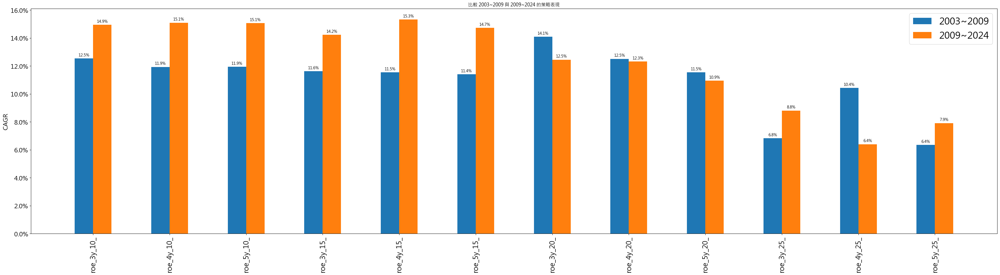

In [46]:
roe_collection.compare_strat_perform('2003~2009','2009~2024')

In [47]:
roe_collection.reports['roe_3y_20_2003~2009'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,14.09%,47.87,-56.39%,43.33%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1303,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.043478,249,2061,2310,-0.411847,-0.522974,0.043362,0.043362,-0.542799,21.0,0.000000,0.000000
1477,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.125000,991,1319,2310,0.145771,-0.260041,2.106229,2.106229,-0.761782,838.0,0.000000,0.000000
2002,2005-04-01,2009-04-01,2005-03-31,2009-03-31,0.125000,991,1319,2310,0.100460,-0.210383,1.376140,0.015704,-0.572777,757.0,0.000000,0.000000
2006,2008-07-01,2009-04-01,2008-06-30,2009-03-31,0.035714,186,2124,2310,-0.462814,-0.665079,0.021819,0.021819,-0.672230,2.0,0.000000,0.000000
2027,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.045455,476,1834,2310,-0.643627,-0.745723,0.103093,0.103093,-0.769487,42.0,0.000000,0.000000
3010,2007-05-02,2009-04-01,2007-04-30,2009-03-31,0.045455,476,1834,2310,-0.522598,-0.631761,0.276960,0.276960,-0.711628,205.0,0.000000,0.000000
3014,2008-10-01,2009-04-01,2008-09-30,2009-03-31,0.030303,122,2188,2310,-0.007857,-0.340704,0.193973,0.193973,-0.447813,42.0,0.000000,0.000000
6188,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.043478,249,2061,2310,-0.188976,-0.429303,0.115197,0.115197,-0.488255,73.0,0.000000,0.000000
6203,2008-07-01,2009-04-01,2008-06-30,2009-03-31,0.035714,186,2124,2310,-0.121833,-0.499395,0.208951,0.208951,-0.585918,45.0,0.000000,0.000000


In [48]:
# roe_collection.plot_roe_cagr()

---

---

## 比較有無某項條件績效差異

In [88]:
import itertools

# 定義所有 DataFrame 名稱及其對應的中文名稱
dataframes = {
    'roe_15': roe_15,  # 假設這些DataFrame已經存在
    'rr_cond': rr_cond,
    'payout_ratio_cond': payout_ratio_cond,
    'profit_cond': profit_cond,
    'hold_cond': hold_cond,
    'listed': listed
}

# 定義 DataFrame 對應的中文名稱
dataframe_names = {
    'roe_15': 'ROE五年平均',
    'rr_cond': '盈再率',
    'payout_ratio_cond': '配息率',
    'profit_cond': '稅後淨利',
    'hold_cond': '董監持股',
    'listed': '上市櫃滿兩年'
}


# 用於儲存組合結果
compare_conds_strat = {}

# 產生不同長度的組合，從1到6
counter = 1
for r in range(1, len(dataframes) + 1):
    for combination in itertools.combinations(dataframes.keys(), r):
        # 計算DataFrame間的 AND 運算
        combined_signal = dataframes[combination[0]]
        for df_name in combination[1:]:
            combined_signal &= dataframes[df_name]

        # 限制日期區間
        combined_signal = CustomDataFrame(combined_signal)
        combined_signal = combined_signal[START_DATE:END_DATE]

        # 使用組合的中文名稱生成key_name
        key_name = "+".join([dataframe_names[df] for df in combination])

        # 將計算結果儲存到字典
        compare_conds_strat[key_name] = combined_signal
        counter += 1

# # 顯示字典中的結果名稱
# for name, expression in compare_conds_strat.items():
#     print(f"{name}:")
#     print(expression)


---

### 分成有無進出場條件兩組

In [89]:
pe_cond_entry_daily = (daily_pe_resample < 12)[START_DATE:END_DATE]
pe_cond_exit_daily = (daily_pe_resample > 30)[START_DATE:END_DATE]


compare_conds_strat['原始條件_有本益比進出場'] = orig_all_cond_and_pe_daily[START_DATE:END_DATE]
compare_conds_strat['原始條件_無本益比進出場'] = orig_all_cond[START_DATE:END_DATE]







compare_strat_collecs = sim_conditions(compare_conds_strat, resample='M', data=data)
# compare_strat_collecs.plot_stats('heatmap')

Backtesting progress: 100%|██████████| 65/65 [09:41<00:00,  8.94s/condition]


In [90]:
compare_strat_collecs.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率+配息率+稅後淨利+董監持股+上市櫃滿兩年,13.35,-51.90,40.18,50.0,14.0,55.0,7.0,78.0
盈再率+配息率+稅後淨利+上市櫃滿兩年,13.22,-54.18,48.18,59.0,14.0,69.0,7.0,97.0
盈再率+配息率+稅後淨利+董監持股,12.33,-52.65,42.96,51.0,15.0,60.0,8.0,83.0
盈再率+配息率+稅後淨利,12.27,-54.31,51.29,60.0,15.0,74.0,8.0,103.0
原始條件_有本益比進出場,11.40,-55.18,23.11,27.0,6.0,35.0,2.0,52.0
...,...,...,...,...,...,...,...,...
ROE五年平均+配息率,5.11,-58.90,94.63,106.0,33.0,153.0,13.0,190.0
ROE五年平均+盈再率+上市櫃滿兩年,5.08,-63.98,108.19,119.0,55.0,164.0,21.0,176.0
ROE五年平均+董監持股,4.71,-61.21,309.81,305.0,282.0,346.0,247.0,375.0


In [ ]:
# compare_df_1 = compare_strat_collecs.selected_stock_count_analysis()
# compare_df_1.to_csv('../2024_code/performance_file/TW/所有排列組合條件_2003-09_無本益比進出場.csv', encoding='cp950')

In [95]:
# 用於儲存組合結果
compare_conds_strat_PE={}

# 產生不同長度的組合，從1到6
counter = 1
for r in range(1, len(dataframes) + 1):
    for combination in itertools.combinations(dataframes.keys(), r):
        # 計算DataFrame間的 AND 運算
        combined_signal = dataframes[combination[0]]
        for df_name in combination[1:]:
            combined_signal &= dataframes[df_name]

        # 限制日期區間
        combined_signal = CustomDataFrame(combined_signal)
        combined_signal = (combined_signal[START_DATE:END_DATE] & pe_cond_entry_daily[START_DATE:END_DATE]).hold_until((~combined_signal[START_DATE:END_DATE]) | pe_cond_exit_daily[START_DATE:END_DATE])

        # 使用組合的中文名稱生成key_name
        key_name = "+".join([dataframe_names[df] for df in combination])

        # 將計算結果儲存到字典
        compare_conds_strat_PE[key_name] = combined_signal
        counter += 1


compare_strat_collecs_PE = sim_conditions(compare_conds_strat_PE, resample='M', data=data)

Backtesting progress: 100%|██████████| 63/63 [13:10<00:00, 12.54s/condition]


In [96]:
compare_strat_collecs_PE.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
盈再率+配息率+稅後淨利+上市櫃滿兩年,13.78,-54.32,40.04,46.0,13.0,55.0,4.0,86.0
盈再率+配息率+稅後淨利,13.71,-54.25,42.36,47.0,13.0,56.0,5.0,92.0
盈再率+配息率+稅後淨利+董監持股+上市櫃滿兩年,13.48,-53.45,33.71,41.0,13.0,47.0,4.0,69.0
盈再率+配息率+稅後淨利+董監持股,13.41,-53.88,35.70,42.0,13.0,47.0,5.0,74.0
配息率+稅後淨利+董監持股+上市櫃滿兩年,12.28,-53.78,55.38,63.0,24.0,71.0,6.0,115.0
...,...,...,...,...,...,...,...,...
ROE五年平均+董監持股,5.32,-63.58,215.10,223.0,199.0,236.0,92.0,311.0
ROE五年平均+上市櫃滿兩年,4.75,-61.60,143.81,149.0,92.0,178.0,23.0,259.0
ROE五年平均+董監持股+上市櫃滿兩年,4.70,-61.22,130.26,140.0,84.0,165.0,23.0,226.0


In [97]:
compare_df_2 = compare_strat_collecs_PE.selected_stock_count_analysis()
compare_df_2.to_csv('../2024_code/performance_file/TW/所有排列組合條件_2003-09_有本益比進出場.csv', encoding='cp950')

In [98]:
compare_strat_collecs_PE.reports['盈再率+配息率+董監持股+上市櫃滿兩年'].display()

,annualized_rate_of_return,sharpe,max_drawdown,win_ratio
,11.15%,54.19,-53.04%,60.32%


,entry_date,exit_date,entry_sig_date,exit_sig_date,position,period,entry_index,exit_index,return,mae,gmfe,bmfe,mdd,pdays,weight,next_weights
stock_id,,,,,,,,,,,,,,,,
1101,2006-04-03,2009-04-01,2006-03-31,2009-03-31,0.011236,743,1567,2310,0.437894,-0.268313,1.807116,1.807116,-0.739345,630.0,0.000000,0.000000
1219,2008-10-01,2009-04-01,2008-09-30,2009-03-31,0.006061,122,2188,2310,0.200104,-0.168030,0.268293,0.063690,-0.217845,51.0,0.000000,0.000000
1303,2008-04-01,2009-04-01,2008-03-31,2009-03-31,0.007634,249,2061,2310,-0.411847,-0.522974,0.043362,0.043362,-0.542799,21.0,0.000000,0.000000
1307,2008-02-01,2009-04-01,2008-01-31,2009-03-31,0.008264,284,2026,2310,0.106364,-0.183497,0.449777,0.449777,-0.436808,178.0,0.000000,0.000000
1325,2008-05-02,2009-04-01,2008-04-30,2009-03-31,0.007463,228,2082,2310,-0.219296,-0.438509,0.238973,0.238973,-0.546810,23.0,0.000000,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
9925,2005-04-01,NaT,2005-03-31,NaT,0.014493,4804,1319,-1,5.986338,-0.143122,6.109282,1.308041,-0.628742,4678.0,0.006173,0.006173
9926,2005-04-01,NaT,2005-03-31,NaT,0.014493,4804,1319,-1,11.307037,-0.078784,11.470456,0.000000,-0.291550,4742.0,0.006173,0.006173
9930,2006-04-03,NaT,2006-03-31,NaT,0.011236,4556,1567,-1,7.618883,-0.011491,8.523685,0.000000,-0.467763,4551.0,0.006173,0.006173


---

## 本益比進場條件放寬 (更大)

In [62]:
per_opts = {}


for i in range(8, 13, 2):

    per_entry_opt = daily_pe_resample < i
            
    per_opts[f'本益比小於_{i}進場'] = (orig_all_cond[START_DATE:END_DATE] & per_entry_opt[START_DATE:END_DATE]).hold_until((~orig_all_cond[START_DATE:END_DATE]) | pe_cond_exit[START_DATE:END_DATE])

PER_opts_test_comb = sim_conditions(per_opts, resample='M', data=data)

Backtesting progress: 100%|██████████| 3/3 [00:08<00:00,  2.90s/condition]


In [63]:
PER_opts_test_comb.selected_stock_count_analysis()

,CAGR (%),MDD (%),入選股數平均,中位數,25%,75%,Min,Max
Strategy,,,,,,,,
本益比小於_12進場,11.40,-55.18,23.11,27.0,6.0,35.0,2.0,52.0
本益比小於_10進場,8.93,-56.27,17.41,17.0,3.0,24.0,1.0,49.0
本益比小於_8進場,3.81,-57.97,15.73,14.0,11.0,17.0,3.0,40.0


In [64]:
PER_opts_test_comb.holding_period_analysis()

,CAGR (%),MDD (%),持有期間平均,25%,中位數,75%,最大值,最小值
Strategy,,,,,,,,
本益比小於_12進場,11.40,-55.18,733.602941,305.25,699.0,1093.00,2192,85
本益比小於_10進場,8.93,-56.27,622.750000,243.00,424.5,989.00,2161,85
本益比小於_8進場,3.81,-57.97,485.478261,181.00,273.0,721.75,1461,29


In [65]:
PER_opts_test_comb.reports['本益比小於_10進場'].cashflow.index[-1]

Timestamp('2009-03-31 00:00:00')

---

### 配息率_本益比進場條件_ROE

In [66]:
# payout_per_opts = {}

# conds_without_roe_payout = (rr_cond & profit_cond & hold_cond & listed)[START_DATE:END_DATE]

# for i in range(0, 56, 5):
#     for j in range(10, 13, 2):
#         for k in range(15, 26, 5):

#             roe_cond_opt = (roe.rolling(5).mean() > k)[START_DATE:END_DATE]

#             payout_ratio_cond_opt = (payout_ratio.rolling(3).min() >= i)[START_DATE:END_DATE]
#             per_entry_opt = (daily_pe_resample < j)[START_DATE:END_DATE]

#             opt_payout_PER_cond = roe_cond_opt & payout_ratio_cond_opt & conds_without_roe_payout
            
#             payout_per_opts[f'配息_{i}%_PE_{j}_ROE_{k}'] = (opt_payout_PER_cond & per_entry_opt).hold_until((~opt_payout_PER_cond) | pe_cond_exit_daily)

# payout_PER_opts_comb = sim_conditions(payout_per_opts, resample='M', data=data)

In [67]:
# payout_PER_opts_comb.reports['配息_45%_PE_12'].display()

In [68]:
# payout_PER_opts_comb.reports['配息_45%_PE_12_ROE_15'].display()

#### 剃除最小入選股數為0

In [69]:
# df_test = payout_PER_opts_comb.selected_stock_count_analysis()
# # filter 'Min' <=0
# df_test[df_test['Min'] > 0]

In [70]:
# df_test.to_csv('../2024_code/performance_file/TW/配息率_本益比_ROE_參數最佳化_2003-09.csv', encoding='cp950')

---

In [71]:
# payout_PER_opts_comb.reports['配息_50%_PE_12_ROE_20'].display()

### 配息率條件放寬 盈再率_本益比進場條件_ROE

In [72]:
# payout_per_rr_opts = {}

# conds_without_roe_payout_rr = profit_cond & hold_cond & listed

# for i in [0, 10, 20, 30, 40]:
#     for j in range(10, 21, 2):
#         for k in range(10, 26, 5):

#             roe_cond_opt = (roe.rolling(5).mean() > k)

#             # 有配息就好
#             payout_ratio_cond_opt = (payout_ratio.rolling(3).min() >= 0)
#             per_entry_opt = daily_pe_resample < j
#             rr_cond_opt = rr < (i/100)

#             opt_payout_PER_rr_cond = (rr_cond_opt & roe_cond_opt & payout_ratio_cond_opt & conds_without_roe_payout_rr)
            
#             payout_per_rr_opts[f'盈再率小於{i}_PE_{j}_ROE_5y_{k}%'] = (opt_payout_PER_rr_cond & per_entry_opt).hold_until((~opt_payout_PER_rr_cond) | pe_cond_exit_daily)

# payout_PER_rr_opts_comb = sim_conditions(payout_per_rr_opts, resample='M', data=data)
# payout_PER_rr_opts_comb.selected_stock_count_analysis()

In [73]:
# payout_PER_rr_opts_comb.reports['盈再率小於0_PE_18_ROE_5y_10%'].display()

In [74]:
# per_rr_roe_opts = {}

# conds_without_roe_payout_rr = profit_cond & hold_cond & listed

# for i in [0, 10, 20, 30, 40]:
#     for j in range(10, 21, 2):
#         for k in range(10, 26, 5):

#             roe_cond_opt = (roe.rolling(5).mean() > k)

#             # payout_ratio_cond_opt = (payout_ratio.rolling(3).min() >= 0)
#             per_entry_opt = daily_pe_resample < j
#             rr_cond_opt = rr < (i/100)

#             opt_PER_rr_roe_cond = rr_cond_opt & roe_cond_opt & conds_without_roe_payout_rr
            
#             per_rr_roe_opts[f'盈再率小於{i}_PE_{j}_ROE_5y_{k}%'] = (opt_PER_rr_roe_cond & per_entry_opt).hold_until((~opt_PER_rr_roe_cond) | pe_cond_exit_daily)

# PER_rr_roe_opts_comb = sim_conditions(per_rr_roe_opts, resample='M', data=data)
# PER_rr_roe_opts_comb.selected_stock_count_analysis()

In [75]:
# PER_rr_roe_opts_comb.reports['盈再率小於0_PE_14_ROE_5y_15%'].display()

---